In [1]:
"""
Use this to visualize traces of microseismic arrivals.

"""
import os
import re
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import segyio
import holoviews as hv
import datetime
import cv2
from scipy.signal import find_peaks
from scipy import ndimage
from pathlib import Path
from obspy import read

In [2]:
os.chdir("..")
os.chdir(os. getcwd() + "\\src")
from c import ROOT_DIR
from mseisML_utils import make_image_from_numpy, stream_to_numpy, make_conditioned_sgy_image, show_conditioned_sgy_image

In [3]:

# define project path

glob_path = Path(ROOT_DIR + "\\segy\\ABstg01")
EvtData = [str(pp) for pp in glob_path.glob("**/*evt.sgy")]
EvtData.sort()
    

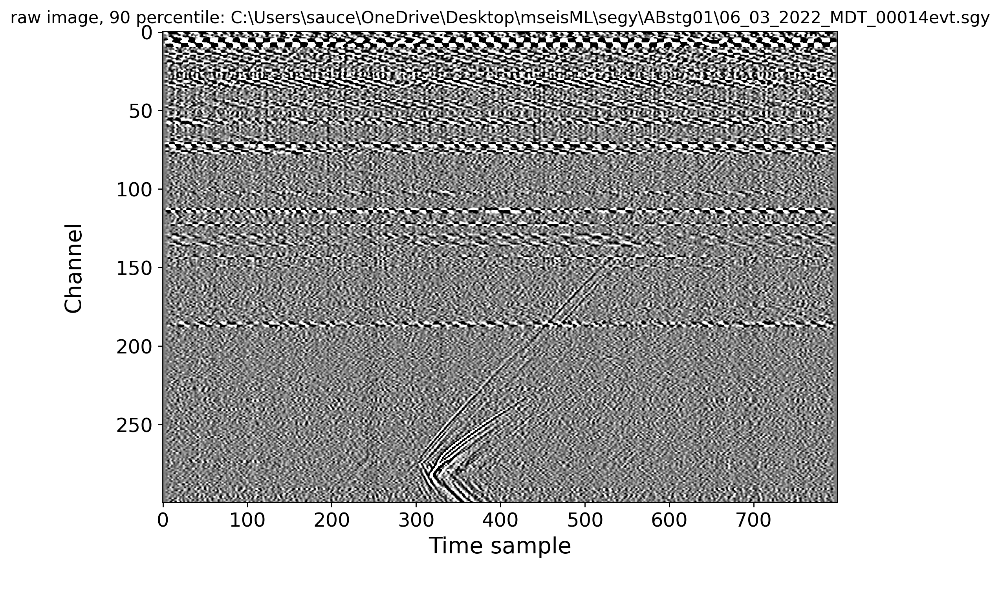

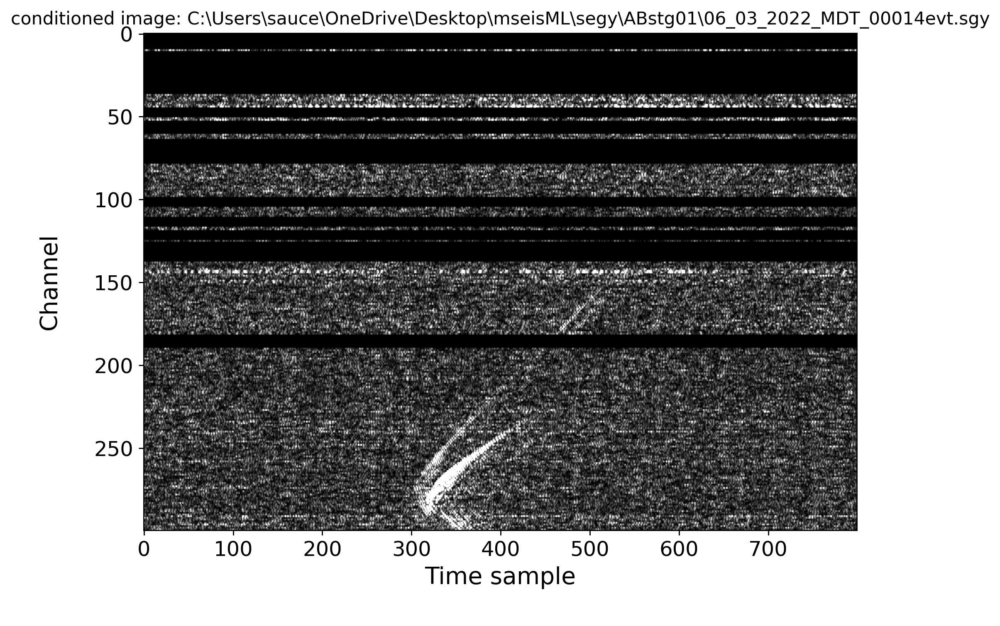

300
800


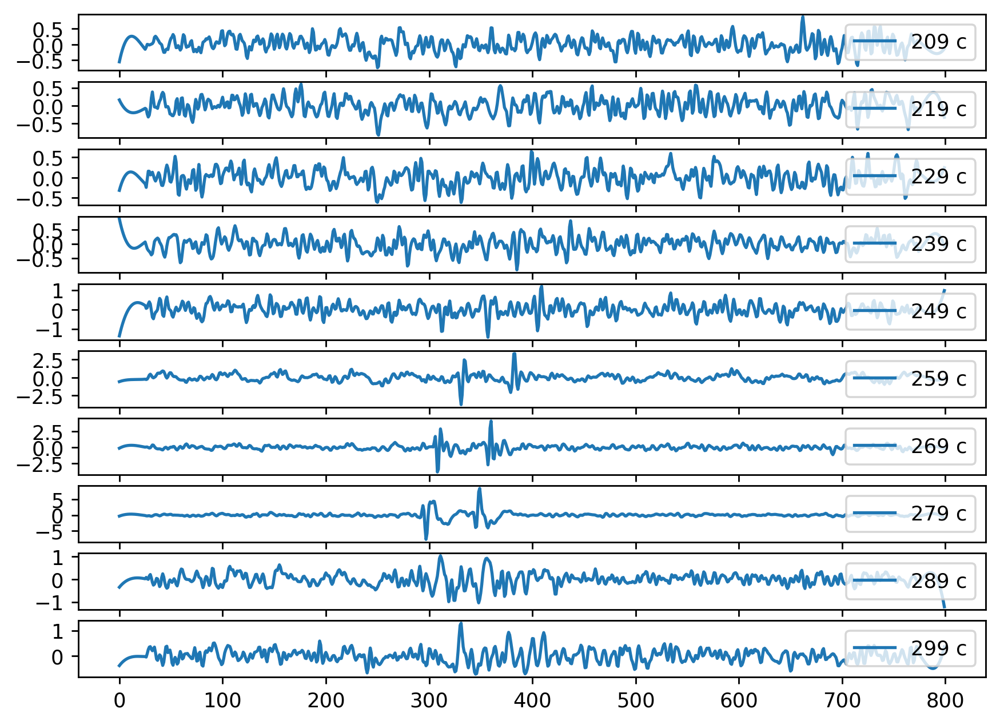

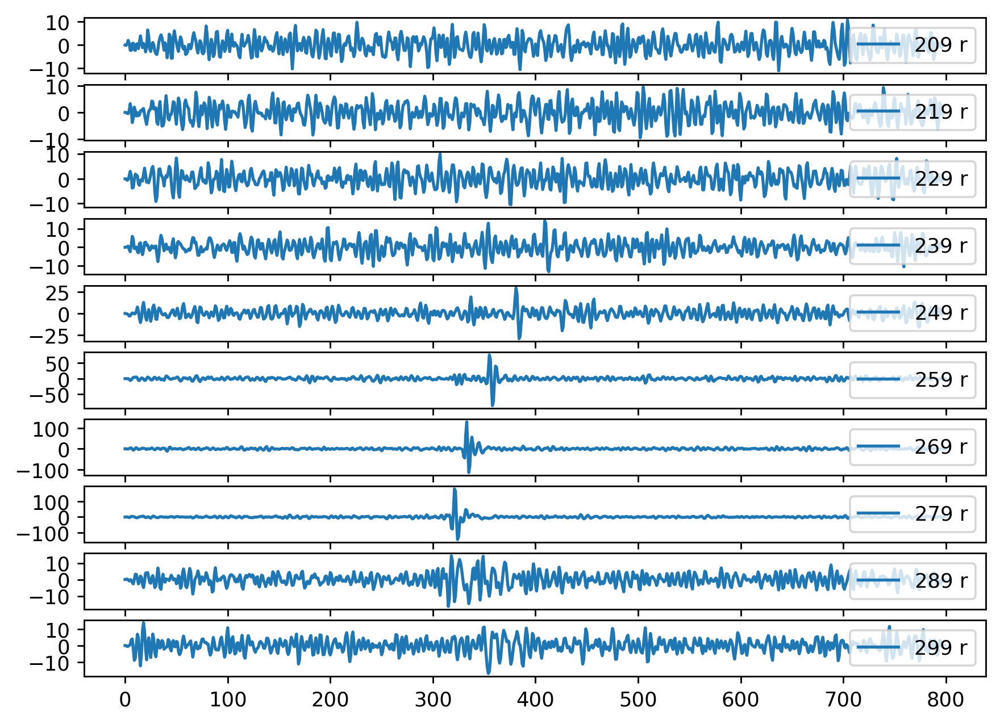

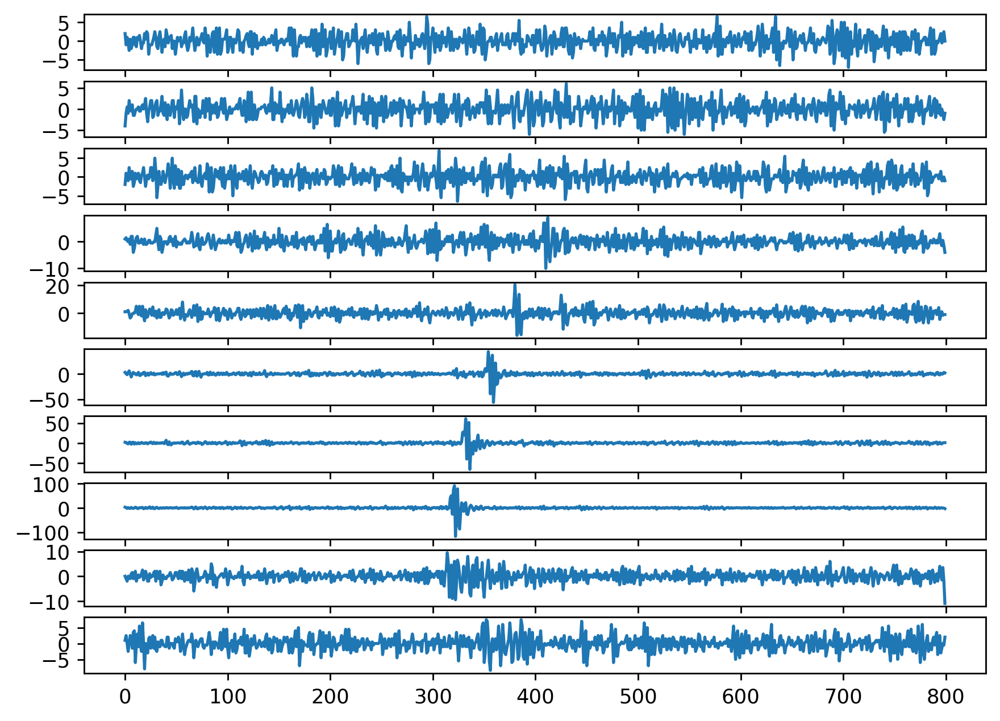

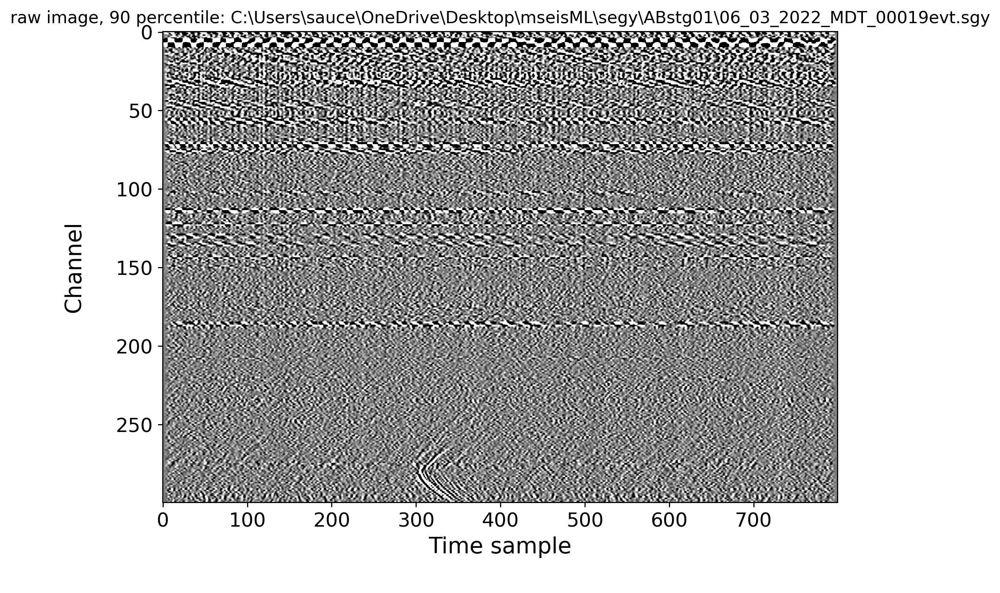

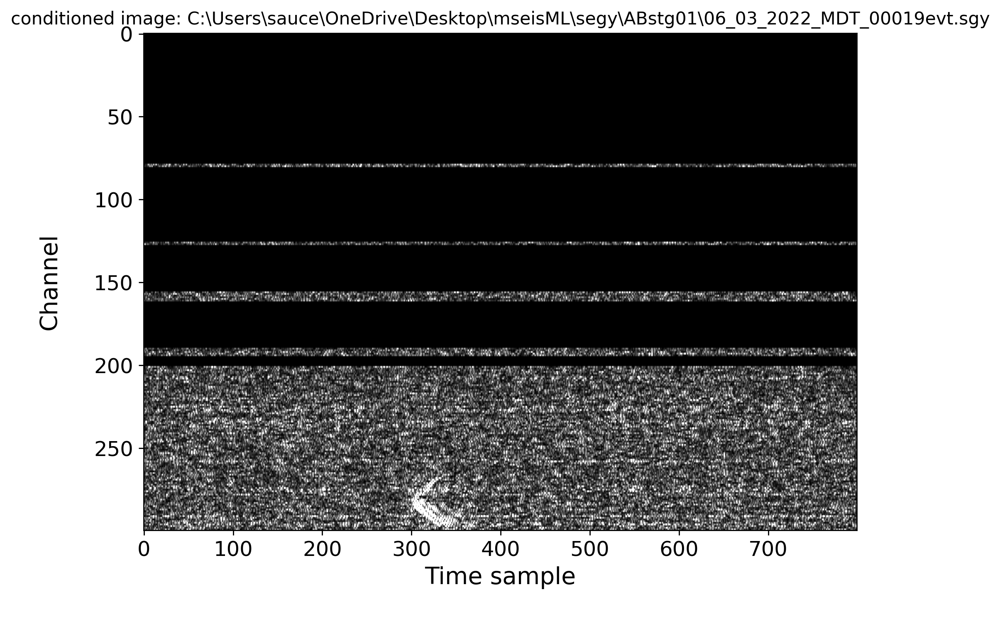

300
800


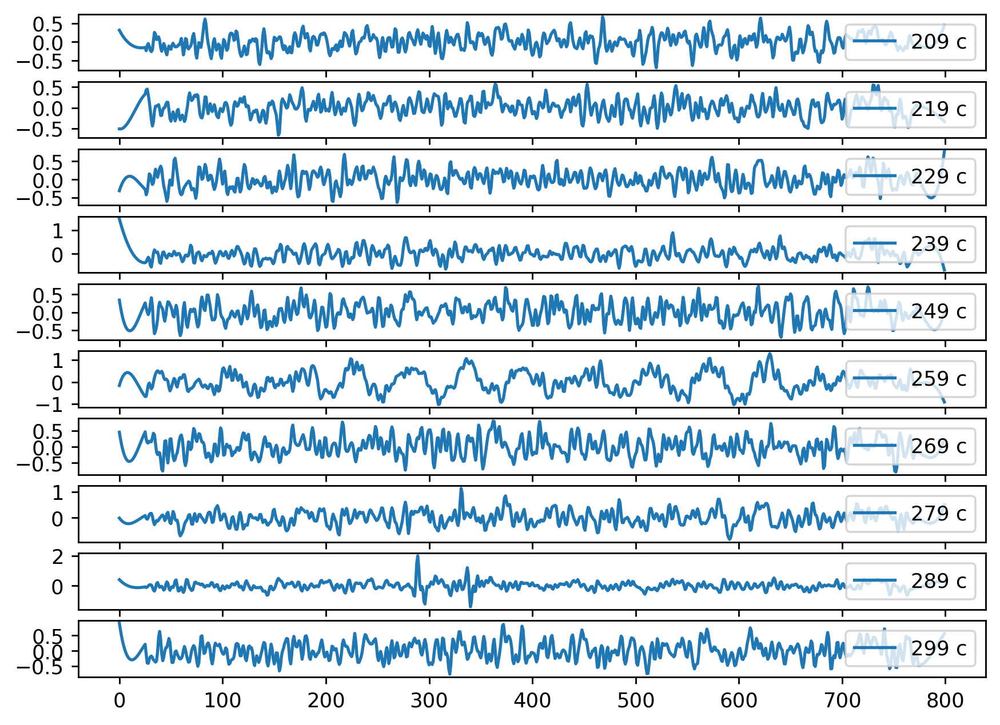

KeyboardInterrupt: 

In [4]:
# run vis analysis here
from scipy.signal import savgol_filter

for file in EvtData:
    st =read(file,format='SEGY')
    st.detrend("linear")
    st.taper(max_percentage=0.01, type="hann")
    
    # raw
            
    data, fs = stream_to_numpy(st, normalise=False)  

    vMine = np.percentile(data,10.0)
    vMaxe = np.percentile(data,90.0)
            
    plt.figure(figsize=(8,6), dpi=256) 
    plt.imshow(data, aspect='auto', vmin=-abs(vMine),vmax=abs(vMaxe), cmap="gray")
    plt.xlabel('Time sample\n',fontsize=16)
    plt.ylabel('Channel\n',fontsize=16)
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.title('raw image, 90 percentile: '+ file)
    plt.tight_layout()
    plt.show()
    
    # with conditioning
    
    data_c = make_conditioned_sgy_image(file)
    
    vMin = np.percentile(data_c,10.0)
    vMax = np.percentile(data_c,99.0)
            
    plt.figure(figsize=(8,6), dpi=256) 
    plt.imshow(data_c, aspect='auto', vmin=-abs(vMin),vmax=abs(vMax), cmap="gray")
    plt.xlabel('Time sample\n',fontsize=16)
    plt.ylabel('Channel\n',fontsize=16)
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.title('conditioned image: '+ file)
    plt.tight_layout()
    plt.show()
    
    # apply edge detection 
    
    
    y_min = 250
    y_max = 700
    
    x_min = 100
    x_max = 300
    
    t_lower = 20
    t_upper = 255
    
    # show amplitude by channel
    
    print(len(data_c[:,300]))
    print(len(data_c[299,:]))
    
    fig, ax = plt.subplots(nrows=10, ncols=1,figsize=(8,6), dpi=256)

    ax[9].plot(savgol_filter(data[299,:], 51, 3), label='299 c')
    ax[8].plot(savgol_filter(data[289,:], 51, 3), label='289 c')
    ax[7].plot(savgol_filter(data[279,:], 51, 3), label='279 c')
    ax[6].plot(savgol_filter(data[269,:], 51, 3), label='269 c')
    ax[5].plot(savgol_filter(data[259,:], 51, 3), label='259 c')
    ax[4].plot(savgol_filter(data[249,:], 51, 3), label='249 c')
    ax[3].plot(savgol_filter(data[239,:], 51, 3), label='239 c')
    ax[2].plot(savgol_filter(data[229,:], 51, 3), label='229 c')
    ax[1].plot(savgol_filter(data[219,:], 51, 3), label='219 c')
    ax[0].plot(savgol_filter(data[209,:], 51, 3), label='209 c')
    
    ax[9].legend(loc="upper right")
    ax[8].legend(loc="upper right")
    ax[7].legend(loc="upper right")
    ax[6].legend(loc="upper right")
    ax[5].legend(loc="upper right")
    ax[4].legend(loc="upper right")
    ax[3].legend(loc="upper right")
    ax[2].legend(loc="upper right")
    ax[1].legend(loc="upper right")
    ax[0].legend(loc="upper right")
    
    plt.show()
    
    fig, ax = plt.subplots(nrows=10, ncols=1,figsize=(8,6), dpi=256)

        
    ax[9].plot(data[299,:], label='299 r')
    ax[8].plot(data[289,:], label='289 r')
    ax[7].plot(data[279,:], label='279 r')
    ax[6].plot(data[269,:], label='269 r')
    ax[5].plot(data[259,:], label='259 r')
    ax[4].plot(data[249,:], label='249 r')
    ax[3].plot(data[239,:], label='239 r')
    ax[2].plot(data[229,:], label='229 r')
    ax[1].plot(data[219,:], label='219 r')
    ax[0].plot(data[209,:], label='209 r')
    
    ax[9].legend(loc="upper right")
    ax[8].legend(loc="upper right")
    ax[7].legend(loc="upper right")
    ax[6].legend(loc="upper right")
    ax[5].legend(loc="upper right")
    ax[4].legend(loc="upper right")
    ax[3].legend(loc="upper right")
    ax[2].legend(loc="upper right")
    ax[1].legend(loc="upper right")
    ax[0].legend(loc="upper right")
    
    plt.show()
    
    # look at gradient
    
    fig, ax = plt.subplots(nrows=10, ncols=1,figsize=(8,6), dpi=256)
    ax[9].plot(np.gradient(data_c[299,:]), label='299 c')
    ax[8].plot(np.gradient(data_c[289,:]), label='289 c')
    ax[7].plot(np.gradient(data_c[279,:]), label='279 c')
    ax[6].plot(np.gradient(data_c[269,:]), label='269 c')
    ax[5].plot(np.gradient(data_c[259,:]), label='259 c')
    ax[4].plot(np.gradient(data_c[249,:]), label='249 c')
    ax[3].plot(np.gradient(data_c[239,:]), label='239 c')
    ax[2].plot(np.gradient(data_c[229,:]), label='229 c')
    ax[1].plot(np.gradient(data_c[219,:]), label='219 c')
    ax[0].plot(np.gradient(data_c[209,:]), label='209 c')
    plt.show()

    
